# Modular Feature Extraction and Matching with ED-SLAM

This notebook demonstrates feature extraction and matching using the modular ED-SLAM components:
- ORBExtractor for feature extraction
- ORBMatcher for feature matching
- Absolute pose estimation with RealSense depth
- Visualization using PoseVisualizer and PointCloudVisualizer

In [1]:
import sys
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from pathlib import Path

# Add the parent directory to the path to import modules
sys.path.append(str(Path.cwd().parent))

# Import our modular components
from sensors.realsense_camera import RealSenseD435i
from features.orb_extractor import ORBExtractor
from features.orb_matcher import ORBMatcher, create_orb_matcher
from pose_estimation.absolute_pose import (
    estimate_absolute_pose_realsense,
    calculate_motion_metrics
)
from utils.rotation_utils import rotation_matrix_to_euler_angles
from visualization.pose_visualizer import PoseVisualizer, create_pose_visualizer
from visualization.point_cloud_visualizer import PointCloudVisualizer, create_point_cloud_visualizer

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


## 1. Initialize Components

In [2]:
# Initialize RealSense camera
camera = RealSenseD435i()
camera.start()

# Initialize ORB feature extractor (same parameters as original notebook)
orb_extractor = ORBExtractor(n_features=500, scale_factor=1.2, n_levels=8)

# Initialize ORB matcher with parameters from notebook
orb_matcher = create_orb_matcher(distance_threshold=50.0, cross_check=True, verbose=True)

# Initialize visualizers
pose_visualizer = create_pose_visualizer(verbose=True)
point_cloud_visualizer = create_point_cloud_visualizer(verbose=True)

print("All components initialized successfully!")

RealSense D435i started successfully
Depth scale: 0.0010000000474974513
Color intrinsics: fx=605.1, fy=604.7
ORB Matcher initialized:
  Distance threshold: 50.0
  Cross-check: True
PoseVisualizer initialized
PointCloudVisualizer initialized
All components initialized successfully!


## 2. Capture Frames

In [3]:
# Capture two frames for feature matching
print("Capturing first frame...")
captured_pair1 = camera.capture_frame_pair()
color_image1, depth_image1 = captured_pair1.get("rgb"), captured_pair1.get("depth")
gray_image1 = cv2.cvtColor(color_image1, cv2.COLOR_BGR2GRAY)

input("Press Enter to capture second frame...")

print("Capturing second frame...")
captured_pair2 = camera.capture_frame_pair()
color_image2, depth_image2 = captured_pair2.get("rgb"), captured_pair2.get("depth")
gray_image2 = cv2.cvtColor(color_image2, cv2.COLOR_BGR2GRAY)

print(f"Frame 1 shape: {color_image1.shape}")
print(f"Frame 2 shape: {color_image2.shape}")

Capturing first frame...
Capturing second frame...
Frame 1 shape: (480, 640, 3)
Frame 2 shape: (480, 640, 3)


## 3. Extract Features Using Modular ORB Extractor

In [4]:
# Extract features from both frames using our modular extractor
print("Extracting features from frame 1...")
keypoints1, descriptors1 = orb_extractor.extract_features(gray_image1)

print("Extracting features from frame 2...")
keypoints2, descriptors2 = orb_extractor.extract_features(gray_image2)

print(f"Frame 1: {len(keypoints1)} keypoints detected")
print(f"Frame 2: {len(keypoints2)} keypoints detected")

Extracting features from frame 1...
Extracting features from frame 2...
Frame 1: 500 keypoints detected
Frame 2: 500 keypoints detected


## 4. Match Features Using Modular ORB Matcher

In [5]:
# Match features using our modular matcher
print("Matching features...")
matches, good_matches = orb_matcher.match_features(descriptors1, descriptors2)

# Analyze match quality
match_quality = orb_matcher.analyze_match_quality(good_matches)
match_stats = orb_matcher.get_match_statistics(matches, good_matches)

Matching features...
Total matches found: 173
Good matches (distance < 50.0): 120
Match quality analysis:
  Average distance: 29.99
  Min distance: 9.00
  Max distance: 49.00
  Std deviation: 9.63
Matching statistics:
  Total matches: 173
  Good matches: 120
  Good match ratio: 69.4%


## 5. Extract Matched Points and Compute Fundamental Matrix

In [6]:
# Extract matched point coordinates using our modular matcher
pts1, pts2 = orb_matcher.extract_matched_points(keypoints1, keypoints2, good_matches)

# Compute fundamental matrix using our modular matcher
F, mask = orb_matcher.compute_fundamental_matrix(
    pts1, pts2, method=cv2.FM_RANSAC, ransac_threshold=3.0, confidence=0.99
)

if F is not None:
    print("Fundamental matrix computed successfully")
    print("Fundamental matrix:")
    print(F)
else:
    print("Failed to compute fundamental matrix")

Extracted 120 matched point pairs
Sample points from frame 1: [[266.11203 210.81602]
 [273.71524 269.56802]
 [415.      257.     ]]
Sample points from frame 2: [[131.32802  95.04001]
 [139.34595 161.74084]
 [288.      149.     ]]
Fundamental matrix computed successfully
Inliers: 105/120 (87.5%)
Fundamental matrix:
[[-2.07647920e-06  1.73554296e-05 -7.32715465e-03]
 [-1.21509341e-05  3.11560463e-06  1.29002255e-02]
 [ 5.76460270e-03 -1.40447240e-02  1.00000000e+00]]
Fundamental matrix computed successfully
Fundamental matrix:
[[-2.07647920e-06  1.73554296e-05 -7.32715465e-03]
 [-1.21509341e-05  3.11560463e-06  1.29002255e-02]
 [ 5.76460270e-03 -1.40447240e-02  1.00000000e+00]]


## 6. Visualize Keypoints and Matches

Keypoint visualization created with 500 keypoints
Keypoint visualization created with 500 keypoints


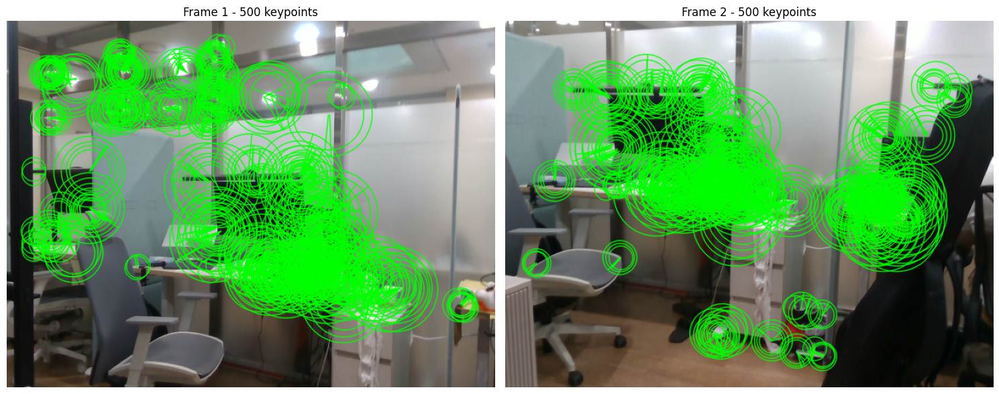

In [7]:
# Visualize keypoints on both frames using our modular matcher
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Draw keypoints using our modular visualizer
img1_with_keypoints = orb_matcher.visualize_keypoints(color_image1, keypoints1)
img2_with_keypoints = orb_matcher.visualize_keypoints(color_image2, keypoints2)

axes[0].imshow(cv2.cvtColor(img1_with_keypoints, cv2.COLOR_BGR2RGB))
axes[0].set_title(f"Frame 1 - {len(keypoints1)} keypoints")
axes[0].axis("off")

axes[1].imshow(cv2.cvtColor(img2_with_keypoints, cv2.COLOR_BGR2RGB))
axes[1].set_title(f"Frame 2 - {len(keypoints2)} keypoints")
axes[1].axis("off")

plt.tight_layout()
plt.show()

Visualizing matches...
Visualization created with 50 matches


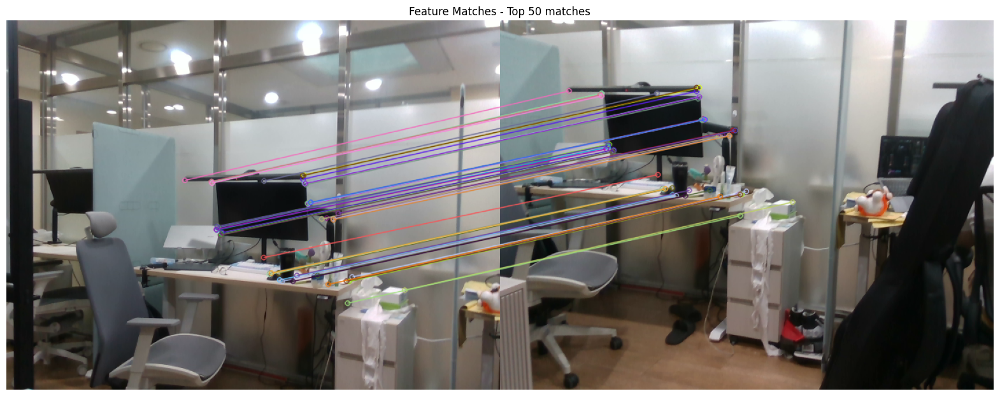

In [8]:
# Visualize matches using our modular matcher
print("Visualizing matches...")
img_matches = orb_matcher.visualize_matches(
    color_image1, keypoints1, color_image2, keypoints2, good_matches, max_matches=50
)

plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
plt.title(f"Feature Matches - Top {min(50, len(good_matches))} matches")
plt.axis("off")
plt.show()

## 7. Analyze Match Quality

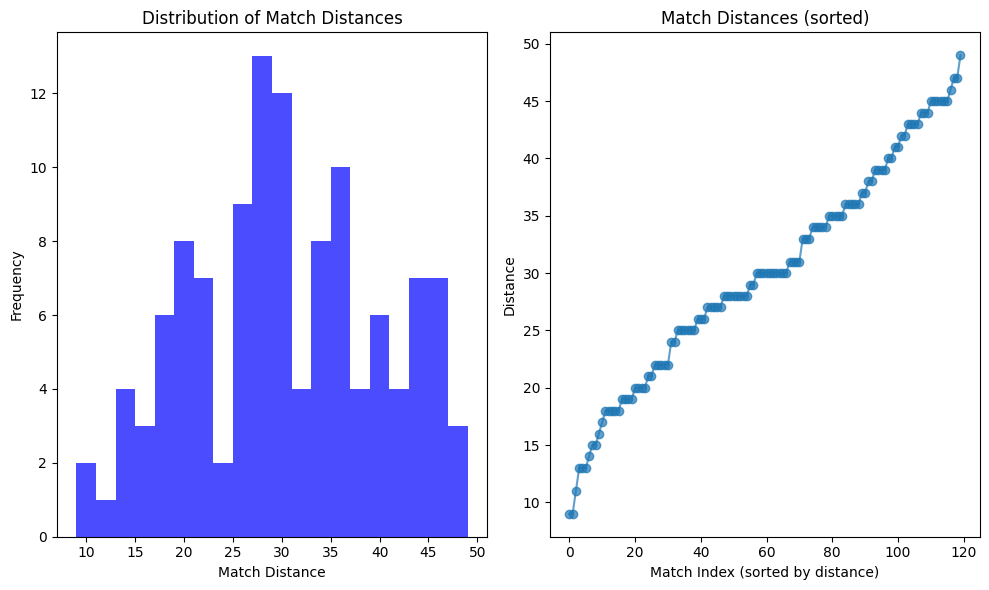

Match quality metrics:
  avg_distance: 29.99
  min_distance: 9.00
  max_distance: 49.00
  std_distance: 9.63


In [9]:
# Analyze match quality using built-in methods
if len(good_matches) > 10:
    distances = [m.distance for m in good_matches]
    
    plt.figure(figsize=(10, 6))
    plt.subplot(1, 2, 1)
    plt.hist(distances, bins=20, alpha=0.7, color='blue')
    plt.xlabel('Match Distance')
    plt.ylabel('Frequency')
    plt.title('Distribution of Match Distances')
    
    plt.subplot(1, 2, 2)
    plt.plot(range(len(distances)), distances, 'o-', alpha=0.7)
    plt.xlabel('Match Index (sorted by distance)')
    plt.ylabel('Distance')
    plt.title('Match Distances (sorted)')
    
    plt.tight_layout()
    plt.show()
    
    print(f"Match quality metrics:")
    for key, value in match_quality.items():
        print(f"  {key}: {value:.2f}")
else:
    print("Not enough good matches for analysis")

## 8. Absolute Pose Estimation Using Our Modular Components

In [10]:
# Get camera intrinsics
fx = camera.camera_intrinsics.fx
fy = camera.camera_intrinsics.fy
cx = camera.camera_intrinsics.cx
cy = camera.camera_intrinsics.cy

K = np.array([[fx, 0, cx], [0, fy, cy], [0, 0, 1]])

print("Camera intrinsic matrix K:")
print(K)
print()

# Perform absolute pose estimation using our modular function
if F is not None and mask is not None:
    print("=== Absolute Scale Camera Pose Estimation ===")
    R_abs, t_abs, points_3d_abs, scale_factor = estimate_absolute_pose_realsense(
        F, K, pts1, pts2, depth_image1, depth_image2, mask, verbose=True
    )
    
    # Calculate motion metrics using our modular function
    motion_metrics = calculate_motion_metrics(R_abs, t_abs, verbose=True)
    
    # Convert rotation matrix to Euler angles using our modular utility
    euler_angles_abs = rotation_matrix_to_euler_angles(R_abs, order='XYZ', degrees=True, verbose=True)
    
    print(f"\n=== Pose Estimation Results ===")
    print(f"Euler angles (Roll, Pitch, Yaw): {euler_angles_abs}")
    print(f"Absolute translation vector: {t_abs.flatten()}")
    print(f"Absolute translation magnitude: {np.linalg.norm(t_abs):.4f}m")
    print(f"Scale factor: {scale_factor:.4f}")
else:
    print("Cannot perform pose estimation: Fundamental matrix computation failed")

Camera intrinsic matrix K:
[[605.13928223   0.         330.82781982]
 [  0.         604.74597168 251.82351685]
 [  0.           0.           1.        ]]

=== Absolute Scale Camera Pose Estimation ===
=== Step 1: Relative pose estimation completed ===
Relative translation vector: [0.56196686 0.12828484 0.8171513 ]
Relative translation magnitude: 1.0000
=== Step 2: Collecting actual depth information ===
Points with valid depth information: 105
=== Step 3: Absolute scale calculation ===
Calculated scale factor: 0.5199 ± 0.0472
Points used: 102/105
=== Step 4: Absolute scale results ===
Absolute camera movement distance: 0.5199m
Absolute translation vector: [0.2921556  0.06669278 0.42482102]
Depth reconstruction error: 0.2279m (average)
Depth reconstruction accuracy: 91.9%

=== Absolute Motion Analysis ===
Total translation distance: 0.5199m (52.0cm)
Primary movement direction: Z-axis (+0.817)
Total rotation angle: 22.63 degrees
Euler angles (XYZ) in degrees: Roll=12.721, Pitch=-18.853, 

## 9. Create Point Clouds Using Modular Visualizer

In [11]:
# Create point cloud from first frame using our modular point cloud visualizer
camera_intrinsics_dict = {
    'fx': camera.camera_intrinsics.fx,
    'fy': camera.camera_intrinsics.fy,
    'cx': camera.camera_intrinsics.cx,
    'cy': camera.camera_intrinsics.cy
}

print("Creating point cloud from RGB-D data...")
pcd = point_cloud_visualizer.create_point_cloud_from_rgbd(
    color_image1, depth_image1, camera_intrinsics_dict, 
    depth_scale=camera.depth_scale  # Pass original depth scale for Open3D conversion
)

# Downsample for better performance
pcd_downsampled = point_cloud_visualizer.downsample_point_cloud(pcd, voxel_size=0.003, max_points=8000)

Creating point cloud from RGB-D data...
Point cloud created with 283760 points
Point cloud bounds: AxisAlignedBoundingBox: min: (-2.58269, -1.20586, -4.996), max: (2.09319, 1.72516, -1.408)
Downsampled: 283760 -> 280472 points


## 10. Visualize Depth Images Using Modular Visualizer

Depth images are already in meters
Depth 1 range: 0.000m - 8.850m
Depth 2 range: 0.000m - 26.933m


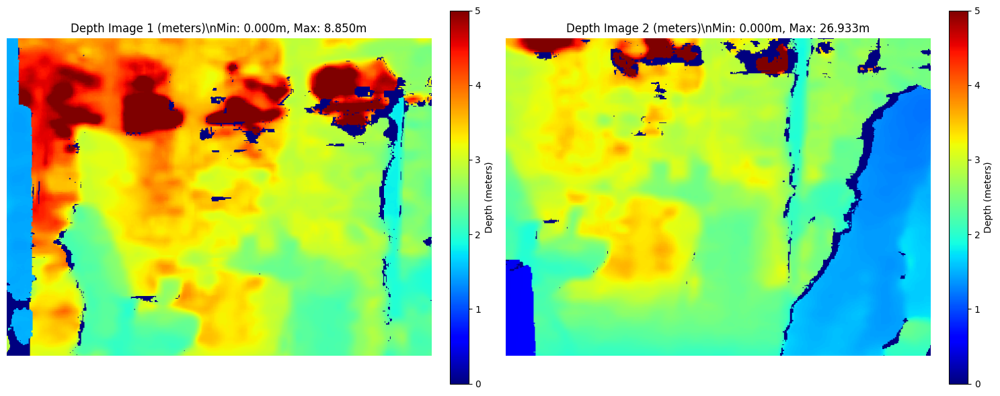

In [12]:
# Visualize depth images using our modular visualizer
depth_viz_data = point_cloud_visualizer.visualize_depth_images(
    depth_image1, depth_image2, 
    titles=("Depth Image 1 (meters)", "Depth Image 2 (meters)")
)

# Display depth images
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

im1 = axes[0].imshow(depth_viz_data['depth_image1'], cmap="jet", vmin=0, vmax=5.0)
axes[0].set_title(f"Depth Image 1 (meters)\\nMin: {depth_viz_data['depth_stats']['min_depth']:.3f}m, Max: {depth_viz_data['depth_stats']['max_depth']:.3f}m")
axes[0].axis("off")
plt.colorbar(im1, ax=axes[0], fraction=0.046, pad=0.04, label="Depth (meters)")

im2 = axes[1].imshow(depth_viz_data['depth_image2'], cmap="jet", vmin=0, vmax=5.0)
axes[1].set_title(f"Depth Image 2 (meters)\\nMin: {depth_viz_data['depth_image2'].min():.3f}m, Max: {depth_viz_data['depth_image2'].max():.3f}m")
axes[1].axis("off")
plt.colorbar(im2, ax=axes[1], fraction=0.046, pad=0.04, label="Depth (meters)")

plt.tight_layout()
plt.show()

## 11. Create Comprehensive 3D Visualization Using Modular Pose Visualizer

In [13]:
# Create comprehensive 3D visualization using our modular pose visualizer
if 'R_abs' in locals() and 't_abs' in locals():
    print("Creating comprehensive 3D visualization...")
    
    # Create reconstructed point cloud from 3D points
    reconstructed_pcd = None
    if len(points_3d_abs) > 0:
        reconstructed_pcd = point_cloud_visualizer.create_reconstructed_point_cloud(
            points_3d_abs, color=[1, 0, 0]
        )
    
    # Create the complete visualization
    fig = pose_visualizer.visualize_absolute_pose(
        R_abs, t_abs, 
        points_3d=points_3d_abs,
        origin_pcd=pcd_downsampled,
        title="Modular ED-SLAM: Absolute Scale Camera Pose Estimation Results",
        window_size=(1200, 900)
    )
    
    # Print legend using our modular visualizer
    pose_visualizer.print_legend(t_abs, scale_factor)
else:
    print("Cannot create 3D visualization: Pose estimation was not successful")

Creating comprehensive 3D visualization...
Reconstructed 3D points: 105 -> 105 (after filtering)
Cleared all geometries
Visualization scale: 0.1040
Processing original point cloud with 280472 points
Downsampled: 280472 -> 93321
Processing reconstructed 3D points
3D points: 105 -> 105 (after filtering)
Creating origin camera visualization
Creating second camera visualization
Camera position: [-0.410, -0.147, -0.283]m
Creating projection rays
Created 45 visualization objects



=== Visualization Legend ===
Blue points: RealSense actual scene point cloud
Red points/spheres: Reconstructed 3D feature points
Red sphere + RGB axes: First camera (origin)
Green sphere + RGB axes: Second camera (absolute position)
Orange arrow: Camera movement path (actual distance)
Yellow sphere: Movement path midpoint
Cyan lines: First camera projection rays
Yellow lines: Second camera projection rays

=== Measurement Summary ===
Actual movement distance: 0.5199m (52.0cm)
Movement direction: [0.292, 0.067, 0.425]
Scale factor: 0.5199


## 12. Save Results Using Modular Components

In [14]:
# Save results using our modular components
save_results = True  # Set to True if you want to save

if save_results:
    # Create output directory
    output_dir = Path("modular_output")
    output_dir.mkdir(exist_ok=True)
    
    # Save images
    cv2.imwrite(str(output_dir / "frame1.jpg"), color_image1)
    cv2.imwrite(str(output_dir / "frame2.jpg"), color_image2)
    cv2.imwrite(str(output_dir / "matches.jpg"), img_matches)
    
    # Save point clouds using our modular visualizer
    if 'pcd_downsampled' in locals():
        point_cloud_visualizer.save_point_cloud(pcd_downsampled, str(output_dir / "scene_pointcloud.ply"))
    
    if 'reconstructed_pcd' in locals() and reconstructed_pcd is not None:
        point_cloud_visualizer.save_point_cloud(reconstructed_pcd, str(output_dir / "reconstructed_points.ply"))
    
    # Save keypoints and matches data
    np.savez(str(output_dir / "modular_features_data.npz"),
             keypoints1=np.array([kp.pt for kp in keypoints1]),
             keypoints2=np.array([kp.pt for kp in keypoints2]),
             descriptors1=descriptors1,
             descriptors2=descriptors2,
             match_distances=np.array([m.distance for m in good_matches]),
             fundamental_matrix=F,
             rotation_matrix=R_abs if 'R_abs' in locals() else None,
             translation_vector=t_abs if 't_abs' in locals() else None,
             euler_angles=euler_angles_abs if 'euler_angles_abs' in locals() else None,
             scale_factor=scale_factor if 'scale_factor' in locals() else None,
             match_quality=match_quality,
             match_stats=match_stats)
    
    print(f"Modular results saved to {output_dir}")
    print(f"Files saved:")
    print(f"  - Images: frame1.jpg, frame2.jpg, matches.jpg")
    print(f"  - Point clouds: scene_pointcloud.ply, reconstructed_points.ply")
    print(f"  - Data: modular_features_data.npz")

Point cloud saved to modular_output/scene_pointcloud.ply
Point cloud saved to modular_output/reconstructed_points.ply
Modular results saved to modular_output
Files saved:
  - Images: frame1.jpg, frame2.jpg, matches.jpg
  - Point clouds: scene_pointcloud.ply, reconstructed_points.ply
  - Data: modular_features_data.npz


## 13. Cleanup

In [15]:
# Cleanup
camera.stop()

RealSense D435i stopped
